In [ ]:
# Kyle Marry - 221011344
# Muhammad Shah - 221021204
# Sithembiso Ntanzi - 221039353
# Yurvan Ramjan - 221004686

In [ ]:
import cv2
import numpy as np
import pandas as pd
import json
import base64
import matplotlib.pyplot as plt
from scipy.stats import skew
from tqdm import tqdm
import random
from collections import Counter
from google.colab import files
import os


from skimage.feature import graycomatrix, graycoprops, canny
from skimage.measure import moments_hu
from skimage.color import rgb2gray

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import to_categorical

from sklearn import svm
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import LabelEncoder

# Image Enhancement Functions

In [ ]:
def equalize_color_image(image):
    img_yuv = cv2.cvtColor(image, cv2.COLOR_BGR2YUV)
    img_yuv[:, :, 0] = cv2.equalizeHist(img_yuv[:, :, 0])
    equalized_color_image = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)
    return equalized_color_image

def equalize_image(gray_image):
    equalized_image = cv2.equalizeHist(gray_image)
    return equalized_image

def get_gray_image(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return gray_image

def noise_reduction_color(image):
    denoised_image = cv2.fastNlMeansDenoisingColored(image, None, 10, 10, 7, 21)
    return denoised_image

def noise_reduction(gray_image):
    denoised_gray_image = cv2.fastNlMeansDenoising(gray_image, None, 10, 7, 21)
    return denoised_gray_image

# Segmentation Functions

In [ ]:
def image_thresholding(gray_image):
    ret, global_thresh = cv2.threshold(gray_image, 127, 255, cv2.THRESH_BINARY)
    return global_thresh

def get_edges(thresh_image):
    edges = cv2.Canny(thresh_image, 50, 150)
    return edges;

# Feature Extraction Functions

In [ ]:
# Function to extract Hu moments
def extract_hu_moments(gray_image):
    moments = cv2.moments((gray_image * 255).astype(np.uint8))
    hu_moments = cv2.HuMoments(moments).flatten()
    return hu_moments.tolist()

# Function to extract edge features
def extract_edge_features(edges):
    edge_density = np.sum(edges) / edges.size
    return [edge_density]

# Function to extract color moments
def extract_color_moments(image):
    R, G, B = cv2.split(image)
    features = []
    for channel in [R, G, B]:
        mean = np.mean(channel)
        std = np.std(channel)
        skewness = calculate_skewness(channel, mean)
        features.extend([mean, std, skewness])
    return features

# Function calculate skewness
def calculate_skewness(channel, mean):
    channel = channel[~np.isnan(channel)]
    if len(channel) == 0:
        return np.nan

    skewness = skew(channel, bias=False)
    return skewness

def extract_features(image):
    gray_image = get_gray_image(image)

    equalized_gray_image = equalize_image(gray_image)
    equalized_color_image = equalize_color_image(image)

    enhanced_color_image = noise_reduction_color(equalized_color_image)
    enhanced_gray_image = noise_reduction(gray_image)

    hu_moments = extract_hu_moments(enhanced_gray_image)
    edge_features = extract_edge_features(get_edges(image_thresholding(enhanced_gray_image)))
    color_moments = extract_color_moments(enhanced_color_image)

    return hu_moments + edge_features + color_moments

# Helper Functions

In [ ]:
def display_image(image, title):
    plt.figure(figsize=(8, 6))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.show()

In [ ]:
def read_json(file_path):
    with open(file_path, 'r') as file:
        data = json.load(file)
    return data

In [ ]:
def decode_base64_image(base64_string):
    if isinstance(base64_string, str):
        # Remove header if present
        base64_string = base64_string.split(',')[1] if ',' in base64_string else base64_string
        # Decode Base64 string
        image_bytes = base64.b64decode(base64_string)
        # Convert bytes to numpy array
        nparr = np.frombuffer(image_bytes, np.uint8)
        # Decode image array
        img = cv2.imdecode(nparr, cv2.IMREAD_COLOR)
        return img
    else:
        print("Invalid Base64 string")
        return None

# Loading Dataset
### Training Set

In [ ]:
json_file_path = '/content/Bank_Note_SA.json'

# Read data from JSON file
json_data = read_json(json_file_path)

# Lists to store data
descriptions = []
image_backs = []
image_fronts = []
values = []

# Iterate through JSON data and collect information into lists
for item in json_data:
    descriptions.append(item.get('Description'))
    image_backs.append(item.get('Image_Back'))
    image_fronts.append(item.get('Image_Front'))
    values.append(item.get('Value'))

# Create DataFrame
df = pd.DataFrame({
    'Description': descriptions,
    'Image_Back': image_backs,
    'Image_Front': image_fronts,
    'Value': values
})

features = []
labels = []

for index, row in tqdm(df.iterrows(), total=df.shape[0], desc="Extracting features"):
    image_back = decode_base64_image(row['Image_Back'])
    image_front = decode_base64_image(row['Image_Front'])

    # Extract features from both images
    features_back = extract_features(image_back)
    features_front = extract_features(image_front)

    # Append to features list
    features.append(features_front)
    features.append(features_back)

    # Append label
    labels.append(row['Value'])
    labels.append(row['Value'])


# Convert features to a DataFrame
features_df = pd.DataFrame(features)
features_df['label'] = labels

features_df.shape

Extracting features: 100%|██████████| 27/27 [01:21<00:00,  3.02s/it]


(54, 18)

In [ ]:
features_df[:3]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,label
0,0.001856,6.864977e-07,3.715432e-10,4.399920e-10,1.737952e-19,3.638941e-13,3.798740e-20,15.207276,92.906243,71.878940,0.236614,144.197681,70.797042,-0.127086,109.842187,75.217946,0.079210,10
1,0.001961,6.367619e-07,1.537767e-10,3.007686e-10,6.390024e-20,2.344565e-13,1.003610e-20,15.178135,95.200497,76.444412,0.321180,139.241572,70.873643,-0.083007,118.950203,76.381671,0.030764,10
2,0.002180,9.699423e-07,1.720748e-10,3.519206e-10,8.621782e-20,3.258406e-13,-8.143137e-21,9.976444,104.704435,69.346143,0.388618,143.190701,71.203214,-0.078578,110.913579,76.321288,0.056184,10


In [ ]:
X_train = features_df.drop('label', axis=1)
y_train = features_df['label']

### Testing Set

In [ ]:
json_file_path = '/content/Bank_Note_SA_Test.json'

# Read data from JSON file
json_data = read_json(json_file_path)

# Lists to store data
descriptions = []
images = []
values = []

# Iterate through JSON data and collect information into lists
for item in json_data:
    descriptions.append(item.get('Description'))
    images.append(item.get('Image'))
    values.append(item.get('Value'))

# Create DataFrame
df_test = pd.DataFrame({
    'Description': descriptions,
    'Image': images,
    'Value': values
})

features_test = []
labels_test = []
for index, row in tqdm(df_test.iterrows(), total=df_test.shape[0], desc="Extracting features"):
    image = decode_base64_image(row['Image'])

    # Extract features from both images
    features_image = extract_features(image)

    # Append to features list
    features_test.append(features_image)

    # Append label
    labels_test.append(row['Value'])

# Convert features to a DataFrame
features_test_df = pd.DataFrame(features_test)
features_test_df['label'] = labels_test

features_test_df.shape

Extracting features: 100%|██████████| 16/16 [00:20<00:00,  1.31s/it]


(16, 18)

In [ ]:
features_test_df[:3]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,label
0,0.002009,9.729931e-07,8.717343e-11,3.507752e-10,6.132480e-20,3.453653e-13,1.311512e-21,36.553273,77.527222,72.490523,0.819018,119.093931,75.983434,0.060337,167.499298,69.874157,-0.507481,20
1,0.001842,8.739123e-07,7.534163e-11,1.684439e-10,1.897295e-20,1.555591e-13,-3.298169e-22,35.529514,76.087625,60.370115,0.429583,119.215206,74.877891,0.059046,164.845145,73.381395,-0.440883,20
2,0.001911,1.054403e-06,1.589184e-10,1.961481e-10,3.356254e-20,1.787562e-13,8.535354e-21,29.177362,133.240060,72.074289,-0.040165,120.994604,73.619453,0.014627,139.739066,74.213179,-0.253686,50


In [ ]:
X_test = features_test_df.drop('label', axis=1)
y_test = features_test_df['label']

In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Support Vector Machines (SVM)

In [ ]:
model_SVC = svm.SVC(kernel='linear', C=1)
model_SVC.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model_SVC.predict(X_test)


accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')


print(classification_report(y_test, y_pred))

Accuracy: 87.50%
              precision    recall  f1-score   support

          10       1.00      1.00      1.00         5
          20       1.00      1.00      1.00         4
          50       0.00      0.00      0.00         2
         100       0.67      1.00      0.80         4
         200       1.00      1.00      1.00         1

    accuracy                           0.88        16
   macro avg       0.73      0.80      0.76        16
weighted avg       0.79      0.88      0.82        16



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Feed-Forward Neural Network Model

In [ ]:
input_dimension = len(X_test[0])
epochs = 50

# Map your original labels to integers
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

num_classes = len(label_encoder.classes_)
y_train_categorical = to_categorical(y_train_encoded, num_classes=num_classes)
y_test_categorical = to_categorical(y_test_encoded, num_classes=num_classes)

# Define the feedforward neural network model
model = Sequential()
model.add(Dense(256, input_shape=(input_dimension,), activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(64, activation='relu'))
model.add(Dense(num_classes, activation='softmax'))

# Train the model
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.fit(X_train, y_train_categorical, epochs=epochs, batch_size=8, validation_split=0.2, verbose=1)

Epoch 1/50
6/6 [==============================] - 2s 89ms/step - loss: 1.7913 - accuracy: 0.1395 - val_loss: 1.5776 - val_accuracy: 0.2727
Epoch 2/50
6/6 [==============================] - 0s 14ms/step - loss: 1.5457 - accuracy: 0.2791 - val_loss: 1.3865 - val_accuracy: 0.6364
Epoch 3/50
6/6 [==============================] - 0s 16ms/step - loss: 1.3346 - accuracy: 0.5814 - val_loss: 1.2376 - val_accuracy: 0.7273
Epoch 4/50
6/6 [==============================] - 0s 12ms/step - loss: 1.2357 - accuracy: 0.6744 - val_loss: 1.1014 - val_accuracy: 0.7273
Epoch 5/50
6/6 [==============================] - 0s 9ms/step - loss: 1.1785 - accuracy: 0.6512 - val_loss: 0.9686 - val_accuracy: 0.8182
Epoch 6/50
6/6 [==============================] - 0s 9ms/step - loss: 0.9124 - accuracy: 0.6977 - val_loss: 0.8473 - val_accuracy: 0.8182
Epoch 7/50
6/6 [==============================] - 0s 13ms/step - loss: 0.8425 - accuracy: 0.7209 - val_loss: 0.7276 - val_accuracy: 0.8182
Epoch 8/50
6/6 [=============

In [ ]:
loss, accuracy = model.evaluate(X_test, y_test_categorical, verbose=0)
print(f"Test Accuracy: {accuracy * 100:.2f}%")
predictions = model.predict(X_test)

y_pred_1 = np.argmax(predictions, axis=1)

# Convert predicted labels back to original classes
y_pred_original = label_encoder.inverse_transform(y_pred_1)
y_pred_original

print(classification_report(y_test, y_pred_original))

Test Accuracy: 100.00%
1/1 [==============================] - 0s 109ms/step
              precision    recall  f1-score   support

          10       1.00      1.00      1.00         5
          20       1.00      1.00      1.00         4
          50       1.00      1.00      1.00         2
         100       1.00      1.00      1.00         4
         200       1.00      1.00      1.00         1

    accuracy                           1.00        16
   macro avg       1.00      1.00      1.00        16
weighted avg       1.00      1.00      1.00        16



# Random Forest Classifier

In [ ]:
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Evaluate the classifier
accuracy = clf.score(X_test, y_test)
print(f"Accuracy: {accuracy * 100:.2f}%")

# Perform cross-validation
cv_scores = cross_val_score(clf, X_train, y_train, cv=5)
print(f"Cross-validation accuracy: {np.mean(cv_scores) * 100:.2f}%")

y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))

Accuracy: 93.75%
Cross-validation accuracy: 96.36%
              precision    recall  f1-score   support

          10       1.00      1.00      1.00         5
          20       1.00      0.75      0.86         4
          50       1.00      1.00      1.00         2
         100       1.00      1.00      1.00         4
         200       0.50      1.00      0.67         1

    accuracy                           0.94        16
   macro avg       0.90      0.95      0.90        16
weighted avg       0.97      0.94      0.94        16



# Try your own image

Upload an image file:


Saving R50-note-Reserve-Bank.jpg to R50-note-Reserve-Bank.jpg
1/1 [==============================] - 0s 22ms/step
SVC prediction: R10
FFN prediction: R50
CLF prediction: R50


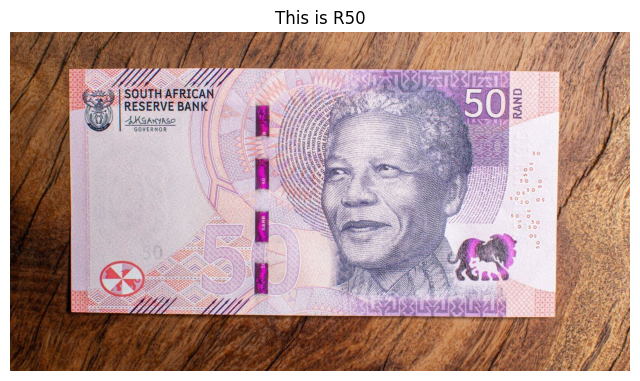

In [ ]:
target_folder = 'uploaded_images'
if not os.path.exists(target_folder):
    os.makedirs(target_folder)
    print(f"Folder '{target_folder}' created.")

# Function to preprocess the selected image
def preprocess_image(file_path):
    image = cv2.imread(file_path)
    return image

print("Upload an image file:")
uploaded = files.upload()

# Save the uploaded image to the target folder
file_name = list(uploaded.keys())[0]
file_path = os.path.join(target_folder, file_name)
with open(file_path, 'wb') as f:
    f.write(uploaded[file_name])

# Preprocess the uploaded image
image = preprocess_image(file_name)

# Extract features from the image
image_features = extract_features(image)
image_features = np.array(image_features)
image_features = scaler.transform(image_features.reshape(1, -1))

# Make predictions using all models
predictions_model_SVC = model_SVC.predict(image_features)
predictions_model =label_encoder.classes_[np.argmax(model.predict(image_features), axis=1)]
predictions_clf = clf.predict(image_features)

print("SVC prediction:", f"R{predictions_model_SVC[0]}")
print("FFN prediction:", f"R{predictions_model[0]}")
print("CLF prediction:", f"R{predictions_clf[0]}")

all_predictions = [
    predictions_model_SVC[0],
    predictions_model[0],
    predictions_clf[0]
]

# Count the occurrences of each prediction
prediction_counts = Counter(all_predictions)

# Determine the majority prediction
most_common_predictions = prediction_counts.most_common()

if len(most_common_predictions) > 1 and most_common_predictions[0][1] == most_common_predictions[1][1]:
    # Choose FFN prediction
    majority_prediction = predictions_model
else:
    # Take the most common prediction
    majority_prediction = most_common_predictions[0][0]

display_image(image, f"This is R{majority_prediction}")


# Image Enhancement Example

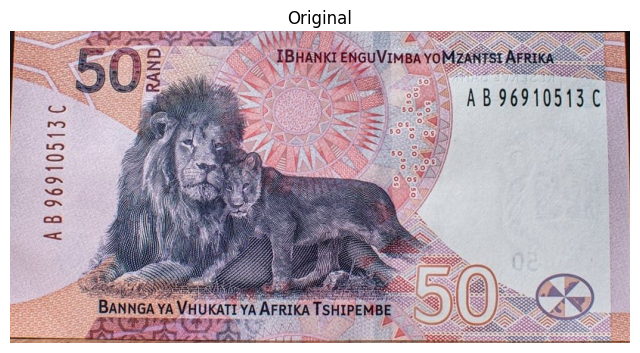

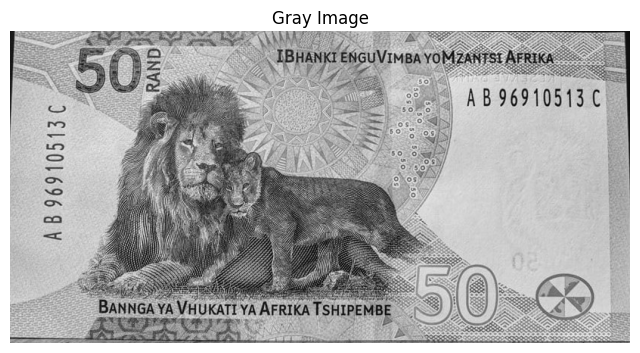

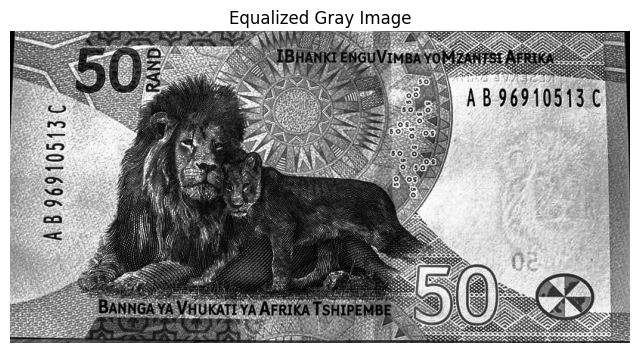

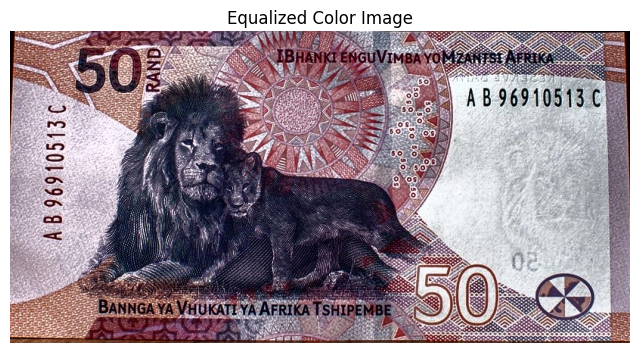

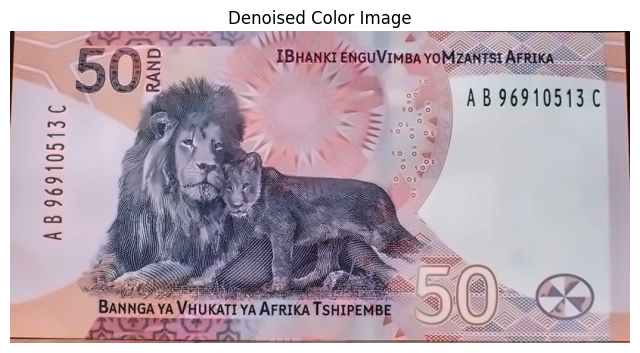

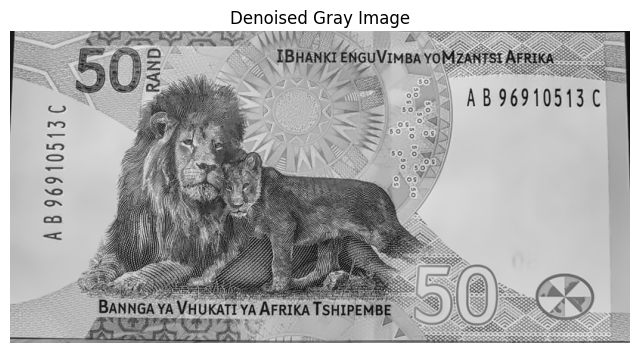

In [ ]:
image = decode_base64_image(df_test['Image'][2])
display_image(image, 'Original')

# Apply each function and show the result
gray_image = get_gray_image(image)
equalized_gray_image = equalize_image(gray_image)
equalized_color_image = equalize_color_image(image)
denoised_color_image = noise_reduction_color(image)
denoised_gray_image = noise_reduction(gray_image)

gray_image = get_gray_image(image)
display_image(gray_image, 'Gray Image')

equalized_gray_image = equalize_image(gray_image)
display_image(equalized_gray_image, 'Equalized Gray Image')

equalized_color_image = equalize_color_image(image)
display_image(equalized_color_image, 'Equalized Color Image')

denoised_color_image = noise_reduction_color(image)
display_image(denoised_color_image, 'Denoised Color Image')

denoised_gray_image = noise_reduction(gray_image)
display_image(denoised_gray_image, 'Denoised Gray Image')

## Testing Set

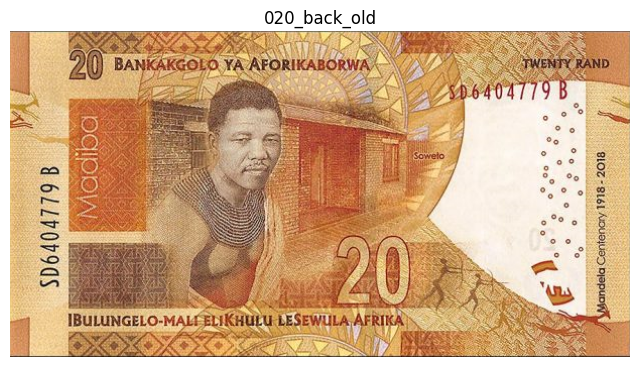

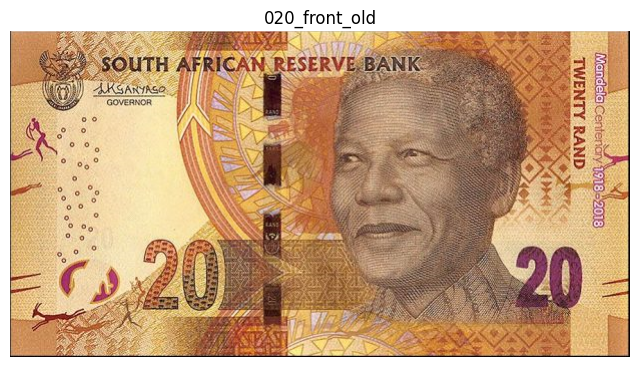

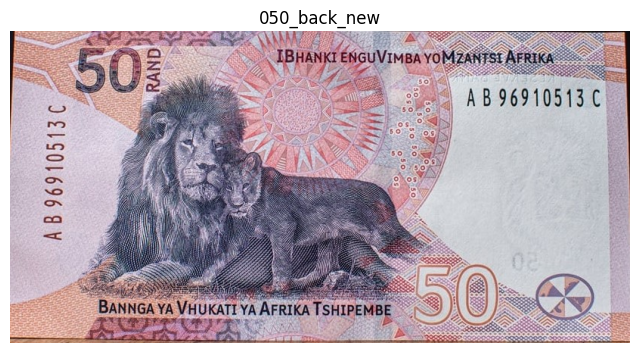

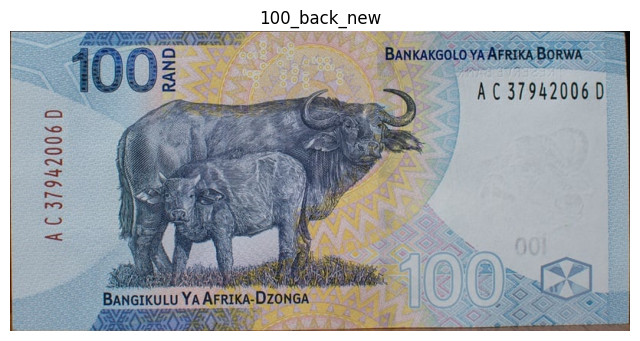

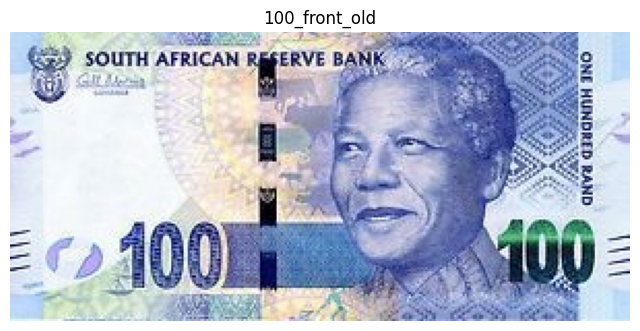

...

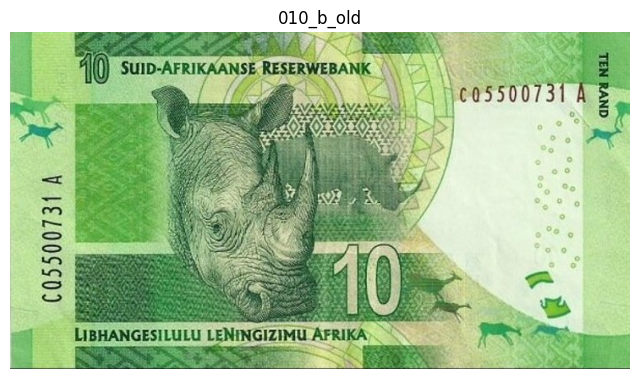

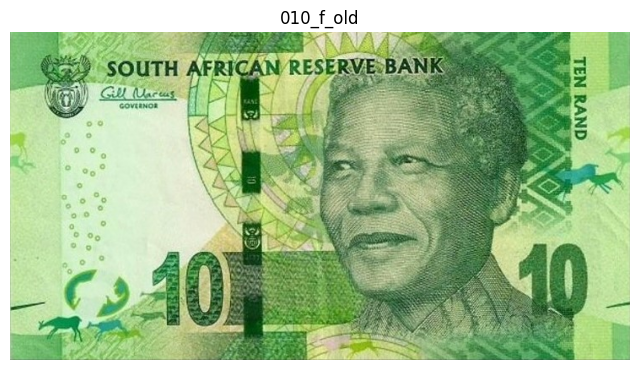

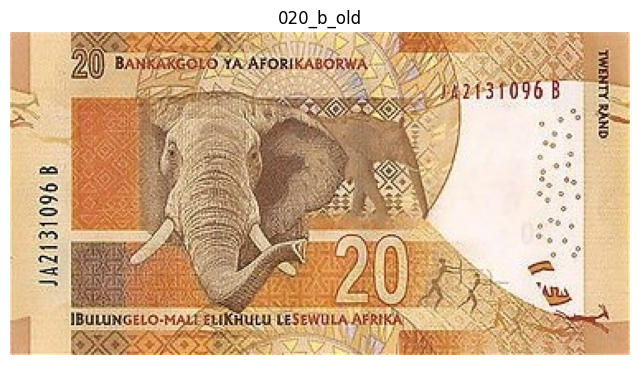

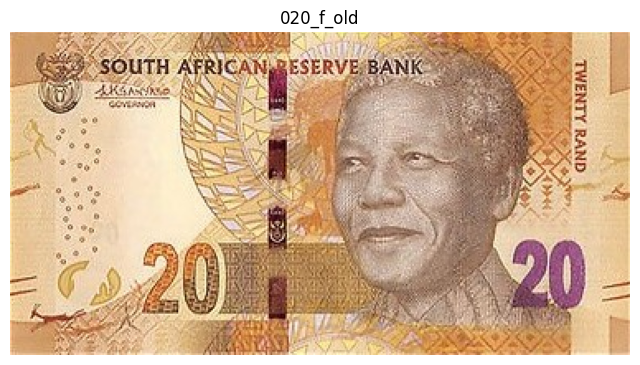

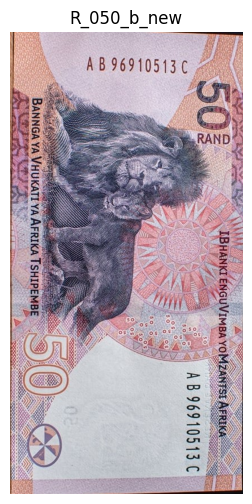

In [ ]:
for index, row in df_test.iterrows():
    image = decode_base64_image(row['Image'])
    display_image(image, row['Description'])